## Import Semua Packages/Library yang Digunakan

In [ ]:
# Mengimpor libraries umum yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

# Mengimpor libraries untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Mengimpor libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Mengimpor libraries untuk pembuatan dan evaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

# Mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
!pip uninstall tensorflow -y

Found existing installation: tensorflow 2.17.0
Uninstalling tensorflow-2.17.0:
  Successfully uninstalled tensorflow-2.17.0


In [ ]:
!pip install tensorflow==2.15

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.1 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

## Data Preparation

### Data Loading

In [ ]:
# Import module yang disediakan google colab untuk kebutuhan upload file
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"karyateguh","key":"742c64c03d7a0a3aee1c613d7e07a15d"}'}

In [ ]:
!kaggle datasets download -d aayushpurswani/diamond-images-dataset
!unzip diamond-images-dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: web_scraped/round/220491-691.jpg  
  inflating: web_scraped/round/220491-697.jpg  
  inflating: web_scraped/round/220491-705.jpg  
  inflating: web_scraped/round/220491-707.jpg  
  inflating: web_scraped/round/220491-86.jpg  
  inflating: web_scraped/round/220492-175.jpg  
  inflating: web_scraped/round/220492-212.jpg  
  inflating: web_scraped/round/220492-82.jpg  
  inflating: web_scraped/round/220493-64.jpg  
  inflating: web_scraped/round/220493-67.jpg  
  inflating: web_scraped/round/220493-75.jpg  
  inflating: web_scraped/round/220494-110.jpg  
  inflating: web_scraped/round/220494-112.jpg  
  inflating: web_scraped/round/220494-132.jpg  
  inflating: web_scraped/round/220494-147.jpg  
  inflating: web_scraped/round/220494-156.jpg  
  inflating: web_scraped/round/220494-185.jpg  
  inflating: web_scraped/round/220494-73.jpg  
  inflating: web_scraped/round/220494-97.jpg  
  inflating: web_scraped/round/220494-99.jpg

Five data in each class

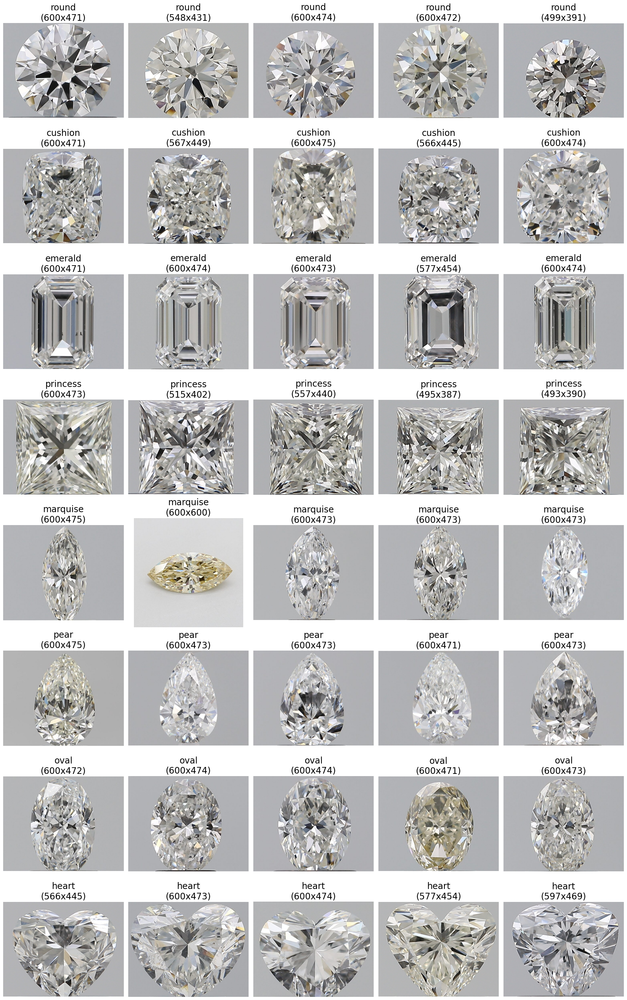

In [ ]:
# Path ke dataset
path = "web_scraped"

# Daftar kelas (sesuaikan dengan nama folder kelas Anda)
classes = [folder for folder in os.listdir(path) if os.path.isdir(os.path.join(path, folder))]

# Menampilkan 5 gambar setiap kelas
fig, axs = plt.subplots(len(classes), 5, figsize=(20, len(classes) * 4))

for i, class_name in enumerate(classes):
    class_path = os.path.join(path, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    if len(image_files) > 0:
        selected_images = np.random.choice(image_files, min(5, len(image_files)), replace=False)

        for j, image_name in enumerate(selected_images):
            img_path = os.path.join(class_path, image_name)
            img = Image.open(img_path)
            width, height = img.size

            axs[i, j].imshow(img)
            axs[i, j].set_title(f"{class_name}\n({width}x{height})", fontsize=20)
            axs[i, j].axis('off')
    else:
        print(f"Tidak ada gambar ditemukan dalam kelas: {class_name}")

# Menyesuaikan layout agar tidak tumpang tindih
fig.tight_layout()
plt.show()

Reduce data into 150x150

Reducing data aims to fasten the process of modelling. If you have limit in TPU/GPU to run the model, this method can be apllied.

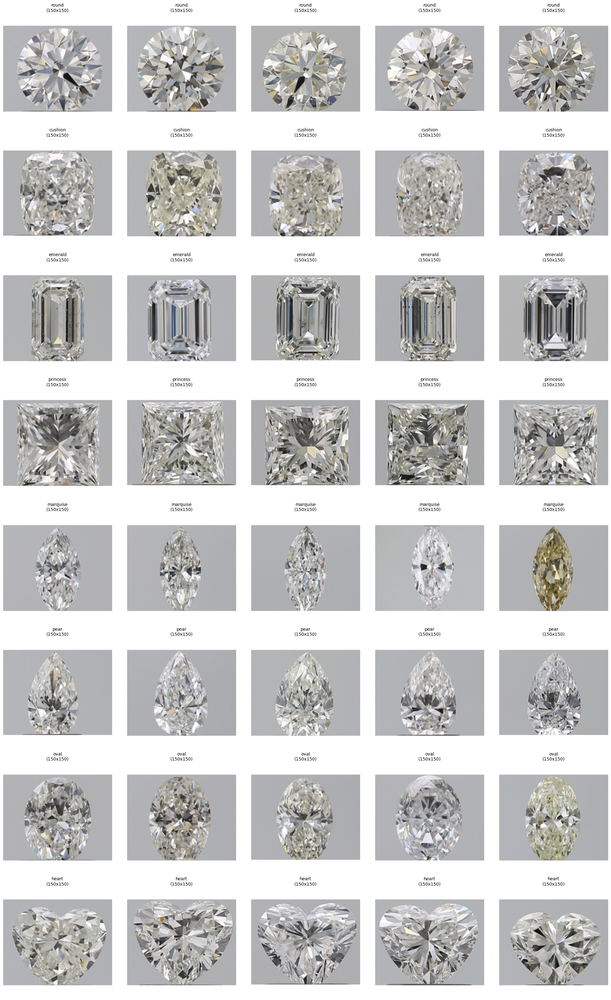

In [9]:
def resize_with_padding(img, target_size):
    # Dapatkan ukuran target
    target_width, target_height = target_size

    # Dapatkan ukuran asli gambar
    width, height = img.size

    # Rasio skala
    scale = min(target_width / width, target_height / height)

    # Ukuran baru
    new_width = int(width * scale)
    new_height = int(height * scale)

    # Resize gambar
    img_resized = img.resize((new_width, new_height), Image.Resampling.LANCZOS)
    #img_resized = img.resize((new_width, new_height), Image.ANTIALIAS)

    # Buat gambar baru dengan latar belakang putih
    result_img = Image.new('RGB', (target_width, target_height), (255, 255, 255))

    # Hitung posisi untuk meletakkan gambar yang diubah ukurannya di tengah
    x_offset = (target_width - new_width) // 2
    y_offset = (target_height - new_height) // 2

    # Tempatkan gambar yang diubah ukurannya di tengah kanvas
    result_img.paste(img_resized, (x_offset, y_offset))

    return result_img

def display_resized_images(input_folder, target_size=(150, 150), num_images_per_class=5):
    # Ambil daftar kelas
    classes = [folder for folder in os.listdir(input_folder) if os.path.isdir(os.path.join(input_folder, folder))]

    fig, axs = plt.subplots(len(classes), num_images_per_class, figsize=(20, len(classes) * 4))

    for i, class_name in enumerate(classes):
        class_path = os.path.join(input_folder, class_name)
        image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

        if len(image_files) > 0:
            selected_images = np.random.choice(image_files, min(num_images_per_class, len(image_files)), replace=False)

            for j, image_name in enumerate(selected_images):
                img_path = os.path.join(class_path, image_name)
                img = Image.open(img_path)
                img_resized = resize_with_padding(img, target_size)
                width, height = img_resized.size

                axs[i, j].imshow(img_resized)
                axs[i, j].set_title(f"{class_name}\n({width}x{height})", fontsize=10)
                axs[i, j].axis('off')
        else:
            print(f"Tidak ada gambar ditemukan dalam kelas: {class_name}")

    # Menyesuaikan layout agar tidak tumpang tindih
    fig.tight_layout()
    plt.show()

# Contoh penggunaan
input_folder = "web_scraped"
display_resized_images(input_folder, target_size=(150, 150), num_images_per_class=5)

Data distribution

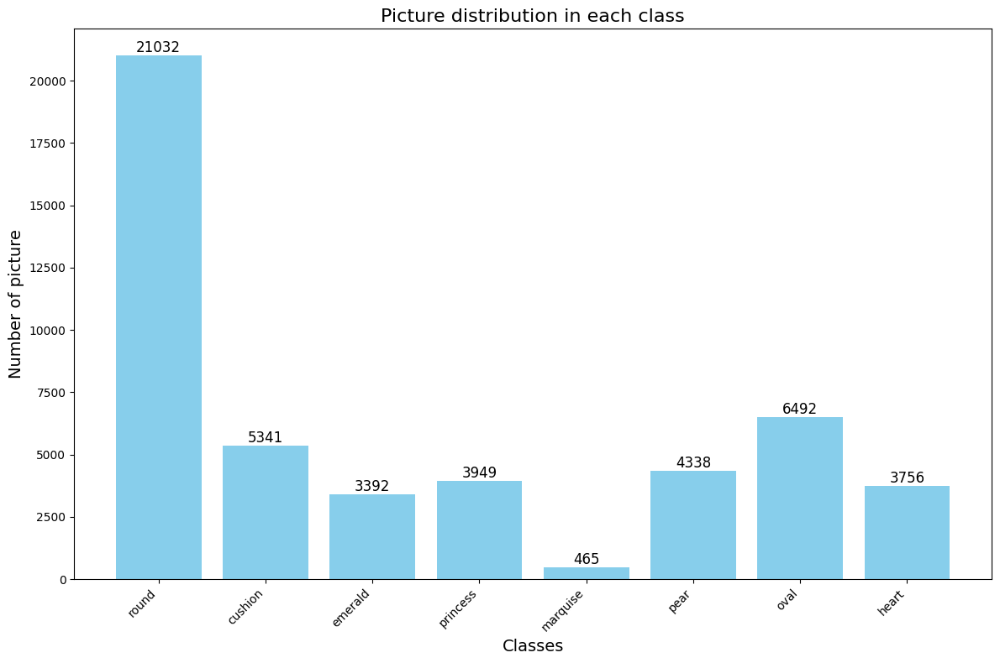

In [12]:
def plot_class_distribution(input_folder):
    # Ambil daftar kelas
    classes = [folder for folder in os.listdir(input_folder) if os.path.isdir(os.path.join(input_folder, folder))]

    # Hitung jumlah gambar per kelas
    class_counts = {}
    for class_name in classes:
        class_path = os.path.join(input_folder, class_name)
        image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        class_counts[class_name] = len(image_files)

    # Visualisasikan distribusi
    plt.figure(figsize=(12, 8))
    bars = plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
    plt.xlabel('Classes', fontsize=14)
    plt.ylabel('Number of picture', fontsize=14)
    plt.title('Picture distribution in each class', fontsize=16)
    plt.xticks(rotation=45, ha='right')

    # Tambahkan anotasi pada setiap batang
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height}', ha='center', va='bottom', fontsize=12)

    plt.tight_layout()
    plt.show()

# Contoh penggunaan
input_folder = "web_scraped"
plot_class_distribution(input_folder)

Oversampling and undersampling data into 1300 each class

The data is imballance. We have to balance the number of each class to make a good model.

In [14]:
def resize_with_padding(img, target_size):
    target_width, target_height = target_size
    width, height = img.size
    scale = min(target_width / width, target_height / height)
    new_width = int(width * scale)
    new_height = int(height * scale)
    img_resized = img.resize((new_width, new_height), Image.Resampling.LANCZOS)
    #img_resized = img.resize((new_width, new_height), Image.ANTIALIAS)
    result_img = Image.new('RGB', (target_width, target_height), (255, 255, 255))
    x_offset = (target_width - new_width) // 2
    y_offset = (target_height - new_height) // 2
    result_img.paste(img_resized, (x_offset, y_offset))
    return result_img

def balance_and_augment_dataset(input_folder, output_folder, target_size=(150, 150), target_count=1300):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Setup ImageDataGenerator for augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    classes = [folder for folder in os.listdir(input_folder) if os.path.isdir(os.path.join(input_folder, folder))]

    for class_name in classes:
        class_path = os.path.join(input_folder, class_name)
        image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
        class_output_folder = os.path.join(output_folder, class_name)
        if not os.path.exists(class_output_folder):
            os.makedirs(class_output_folder)

        num_images = len(image_files)

        if num_images > target_count:
            # Undersample
            selected_images = random.sample(image_files, target_count)
        else:
            # Oversample
            selected_images = image_files.copy()
            while len(selected_images) < target_count:
                selected_images.extend(random.choices(image_files, k=target_count - len(selected_images)))

        for img_name in selected_images:
            img_path = os.path.join(class_path, img_name)
            img = Image.open(img_path)
            img_resized = resize_with_padding(img, target_size)

            # Save original resized image
            img_resized.save(os.path.join(class_output_folder, img_name))

            # Apply data augmentation only if oversampling was needed
            if num_images < target_count:
                img_array = np.array(img_resized)
                img_array = np.expand_dims(img_array, axis=0)

                # Generate augmented images
                i = 0
                for batch in datagen.flow(img_array, batch_size=1):
                    augmented_img = batch[0].astype(np.uint8)
                    augmented_img_pil = Image.fromarray(augmented_img)
                    output_path = os.path.join(class_output_folder, f"{img_name}_aug_{i}.jpg")
                    augmented_img_pil.save(output_path)
                    i += 1
                    if len(selected_images) + i >= target_count:
                        break

        print(f"Processed {class_name}: {len(selected_images)} images (including augmented images)")

# Contoh penggunaan
input_folder = "web_scraped"
output_folder = "balanced_dataset"
balance_and_augment_dataset(input_folder, output_folder, target_size=(150, 150), target_count=1300)

Processed round: 1300 images (including augmented images)
Processed cushion: 1300 images (including augmented images)
Processed emerald: 1300 images (including augmented images)
Processed princess: 1300 images (including augmented images)
Processed marquise: 1300 images (including augmented images)
Processed pear: 1300 images (including augmented images)
Processed oval: 1300 images (including augmented images)
Processed heart: 1300 images (including augmented images)


### Data Preprocessing

#### Split Dataset

In [16]:
input_folder = "balanced_dataset"
train_folder = "train"
test_folder = "test"

# Membuat folder train dan test
for folder in [train_folder, test_folder]:
    for class_name in os.listdir(input_folder):
        os.makedirs(os.path.join(folder, class_name), exist_ok=True)

# Membagi dataset secara manual
for class_name in os.listdir(input_folder):
    class_path = os.path.join(input_folder, class_name)
    image_files = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    train_files, test_files = train_test_split(image_files, test_size=0.2, random_state=42)

    for file in train_files:
        shutil.copy(os.path.join(class_path, file), os.path.join(train_folder, class_name, file))

    for file in test_files:
        shutil.copy(os.path.join(class_path, file), os.path.join(test_folder, class_name, file))

print("Dataset has been split into train and test set.")

# Setup ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255
)

train_gen = datagen.flow_from_directory(
    train_folder,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

test_gen = datagen.flow_from_directory(
    test_folder,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)


Dataset has been split into train and test set.
Found 8024 images belonging to 8 classes.
Found 2006 images belonging to 8 classes.


## Modelling

In [17]:
# Building model Sequential
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_gen.class_indices), activation='softmax')  # Jumlah kelas
])

model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  bias_initializer="zeros",


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 36992)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       4,735,104 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │           1,032 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,829,384 (18.42 MB)

 Trainable params: 4,829,384 (18.42 MB)

 Non-trainable params: 0 (0.00 B)

In [20]:
# Adjust learning rate
learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train model
history = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=30,
    callbacks=[early_stopping, model_checkpoint]
)

Epoch 1/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step - accuracy: 0.9694 - loss: 0.0918 - val_accuracy: 0.9945 - val_loss: 0.0314
Epoch 2/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - accuracy: 0.9749 - loss: 0.0654 - val_accuracy: 0.9945 - val_loss: 0.0303
Epoch 3/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - accuracy: 0.9777 - loss: 0.0644 - val_accuracy: 0.9930 - val_loss: 0.0315
Epoch 4/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.9829 - loss: 0.0527 - val_accuracy: 0.9930 - val_loss: 0.0400
Epoch 5/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 12s 41ms/step - accuracy: 0.9848 - loss: 0.0460 - val_accuracy: 0.9925 - val_loss: 0.0319
Epoch 6/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step - accuracy: 0.9862 - loss: 0.0366 - val_accuracy: 0.9915 - val_loss: 0.0357
Epoch 7/30
251/251 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - accuracy: 0.9832 - loss: 0.0453 - val_accuracy: 0.9955 - val_loss: 0.0309


## Evaluasi dan Visualisasi

In [21]:
# Evaluasi model menggunakan data pengujian
train_loss, train_accuracy = model.evaluate(train_gen)
print(f"Train Accuracy: {train_accuracy:.2f}")
print(f"Train Loss: {train_loss:.2f}")

test_loss, test_accuracy = model.evaluate(test_gen)
print(f"Test Accuracy: {test_accuracy:.2f}")
print(f"Test Loss: {test_loss:.2f}")

251/251 ━━━━━━━━━━━━━━━━━━━━ 8s 33ms/step - accuracy: 0.9967 - loss: 0.0084
Train Accuracy: 1.00
Train Loss: 0.01
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.9955 - loss: 0.0215
Test Accuracy: 0.99
Test Loss: 0.03


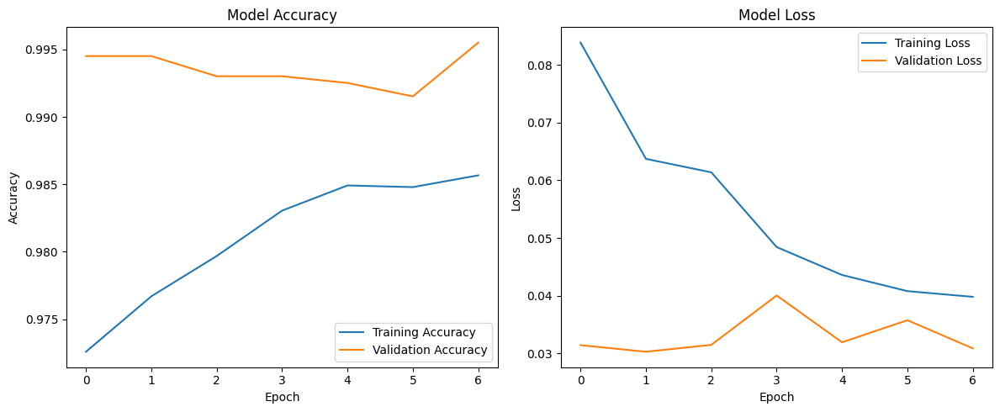

In [22]:
# Plot Akurasi
plt.figure(figsize=(12, 5))

# Plot akurasi pelatihan
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

## Konversi Model

In [23]:
# Menyimpan model dalam format SavedModel
export_dir = 'saved_model/'
tf.saved_model.save(model, export_dir)

Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7c78bd3cab00>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7c78bd3cab00>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7c78bd3041f0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function TFLayer._default_save_signature.<locals>.serving_default at 0x7c78bd3041f0>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


In [25]:
# Konversi model ke format TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Menyimpan model TFLite ke file
tflite_model_path = 'diamond.tflite'
with open(tflite_model_path, 'wb') as f:
  f.write(tflite_model)

print(f"Model has been coverted and saved as {tflite_model_path}")

Saved artifact at '/tmp/tmpygsu9wyv'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 8), dtype=tf.float32, name=None)
Captures:
  136858010781824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858010510336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858010793440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858013146928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008381472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008376368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008387280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008380944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008380416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136858008106288: TensorSpec(shape=(), dtype=tf.resource, name=None)
Model has been c

In [26]:
!pip install tensorflowjs

  Using cached tensorflow-2.17.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.2 kB)
  Using cached ml_dtypes-0.4.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.5/15.5 MB 55.1 MB/s eta 0:00:00
Using cached tensorflow-2.17.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (601.3 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 1.5 MB/s eta 0:00:00
Using cached ml_dtypes-0.4.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 71.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 85.9 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.1
    Uninstalling packaging-24.1:
     

In [27]:
!tensorflowjs_converter --input_format=tf_saved_model saved_model tfjs_model

2024-10-08 06:55:44.898534: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-08 06:55:44.973349: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-08 06:55:44.994745: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-08 06:55:47.666177: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
I0000 00:00:1728370550.288778    8348 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/b

## Inference (Optional)

In [34]:
# Siapkan interpreter
interpreter = tf.lite.Interpreter(model_path='diamond.tflite')
interpreter.allocate_tensors()

# Dapatkan detail tensor input dan output
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Preprocessing Data Input
def preprocess_image(image_path, target_size=(150, 150)):
    image = Image.open(image_path)
    image = image.resize(target_size)
    image_array = np.array(image, dtype=np.float32) / 255.0  # Change here to ensure float32
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

# Menjalankan Inference
def infer_image(image_path):
    input_data = preprocess_image(image_path)

    # Set input tensor
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])

    return output_data

# Menafsirkan Hasil Output
def get_predicted_class(output_data, class_names):
    predicted_class_index = np.argmax(output_data, axis=1)[0]
    predicted_class_name = class_names[predicted_class_index]
    return predicted_class_name


image_path = 'test/emerald/1945119.jpg'  # Path ke gambar yang ingin diprediksi
class_names = ['cushion', 'emerald', 'heart', 'marquise', 'oval', 'pear', 'princess', 'round']  # Nama kelas sesuai dataset

# Output dari inferensi
output_data = infer_image(image_path)

# Menentukan kelas prediksi
predicted_class_name = get_predicted_class(output_data, class_names)

print(f"Prediction: {predicted_class_name}")

Prediction: emerald


In [40]:
!pip freeze > requirements.txt